# Varmeligning

## 1. Fra Poissonligning til Varmeligningen

Vi har sett hvordan en endimensjonal Poissonligning

$$
u_{xx} + f(x) = 0
$$

med passende randbetingelser (f. eks., $u(0)=a, u(1)=b$)

kan tilnærmes med et lineært system

$$
L\vec{u} + \vec{F} = 0.
$$

Beskjeden er enkelt og greit at varmeligningen

$$
u_t = c^2 u_{xx} + f(x), \quad u(0,x)=g(x)
$$

Tilnærmes med den tilsvarende *ordinære* differensialligning,

$$
\vec{u}_t = c^2 L\vec{u} + \vec{F}, \quad \vec{u}(0)=\vec{g},
$$

hvor $\vec{g}$ er en vektor med $g_i = g(x_i)$. 

### a) Koden gjenbrukes fra 6_1: Dirichlet

Når vi skal løse varmeligningen numerisk, den første steg er altså å lage matrisen $L$ og vektoren $\vec{F}$. Vi gjenbruker koden fra 6_1. Ta først Dirichlet randbetingelser

$$
u(0)=a, \quad u(1)=b.
$$

Vektoren $\vec{F}$ er slik at $F_i = f(x_i)$, bare at vi må legge til 

$$
F_1 = f(x_0) - \frac{c^2 a}{h^2}, \quad F_m = f(x_m) - \frac{c^2 b}{h^2}
$$

på grunn av randbetingelsene, akkurat som med Poisson-ligningen. Vi får en ekstra $c^2$ i leddene pga det kommer fra $c^2 u_{xx}$, ikke bare $u_{xx}$.



In [1]:
import numpy as np
import scipy.sparse as sp
import scipy.sparse.linalg as lin


m=20

# setter opp gitteret
# inkluderer endpunktene, bruk x[1:-1] hvis det trenges uten endpunkter
x = np.linspace(0,1,m+2)

h = x[1]-x[0]

c = 1

L = (1/h**2)*sp.diags([1,-2,1],[-1,0,1],shape=(m,m))

A = (c**2)*L

a = 0
b = 0

# randbetingelsene
F = np.zeros(m)

F[0] = (c**2) * -a/(h**2)
F[-1] = (c**2) * -b/(h**2)

### b) Koden gjenbrukes fra 6_1: Neumann

Antar nå at vi har Neumann randbetingelser, $u'(0) = a, u'(1) = b$?.

Husk at den skiller seg fra Dirichlet oppgaven i at vi ikke lenger vet hva $u_0$ og $u_{m+1}$ skal være. Vi la dermed til to nye ligninger

$$
\frac{u_1 - u_0}{h} = u'(0) = a, \quad 
\frac{u_{m+1} - u_{m}}{h} = u'(1) = b,
$$

som ble to ekstra rader i matrisen $L$. Vi legger til tilsvarende

$$
F_1 = f(x_0) - c^2 a, \quad F_{m+1} = f(x_{m+1}) - c^2 b
$$

i vektoren $\vec{F}$. Også her har vi lagt til en faktor av $c^2$. Grunnen til det er at vi vil at ligningen $c^2 L - \vec{F} = $ inkluderer de to ligningene fra randebtingelsene, og siden vi ganget $L$ med $c^2$ må vi gjøre det samme med $a$ og $b$ i $\vec{F}_1$ og $\vec{F}_{m+1}$.

In [2]:
# gitteret x beholdes

# matrisen er som før, men m+2 x m+2
L2 = (1/h**2)*sp.diags([1,-2,1],[-1,0,1],shape=(m+2,m+2))

# endrer filformaten slik at vi kan endre radene
L2 = sp.csr_matrix(L2)

# første rad fra Neumann betingelser på venstre siden
L2[0,0] = -1/h
L2[0,1] = 1/h
# siste rad fra Neumann betingelser på høyre siden
L2[-1,-1] = -1/h
L2[-1,-2] = 1/h

# setter opp vektor på høyre siden
# har antar vi at funksjon f(x)=0
G = np.zeros(m+2)

# Legger til randbetingelsene i vektor på høyre side
G[0] = G[0] - (c**2)*a
G[-1] = G[-1] - (c**2)*b

## 2. Løsning av ODEen

Den vanlige (forlengs) Euler metode for den nye ligningen er da

$$
\vec{u}_{n+1} = \vec{u}_n + k\big(L\vec{u}_n + \vec{F}\big) = (I+kL)\vec{u}_n + \vec{F},
$$

hvor $u_n = u(kn)$ er en diskretisering i tid med stegslengde lik $k$. Den fungerer fint, *men bare hvis stegslengdene oppfyller kravet* 

$$
c^2\frac{k}{h^2}<\frac{1}{2}.
$$

Det er ikke noen vits, resultatet kommer til å være helt meningsløs hvis den er ikke oppfylt, vanligvis vil $u_n$ går raskt mot uendelig. I praksis er den uheldig, siden resultatet er at $k$ må være veldig liten i forhold til $h$, og vi trenger derfor ofte mye tidssteg for å oppnå en ønsket nøyaktighet. En mye bedre metode er baklengs Euler:

$$
\vec{u}_{n+1} = \vec{u}_n + k\big(A\vec{u}_{n+1} + \vec{F}\big),
$$

da vi kan finne $\vec{u}_{n+1}$ ved å løse det linæeare systemet

$$
(I - kA)\vec{u}_{n+1} = \vec{u}_n + \vec{F}.
$$

Matrisen $I-kA$ er forøvrig konstant i tid, og vi trenger derfor å invertere den (eller bedre: finne sin Cholesky-faktorering) bare en gang. Denne metoden gir alltid rimelige løsninger.

### a) Eksempel 1: Dirichlet randbetingelser

Vi løser varmeligningen

$$
u_t = u_{xx}, \quad 0<x<1, \quad u(0,t)=0, u(1,t)=0, \quad u(x,0)=\sin(\pi x)
$$

med koden under.

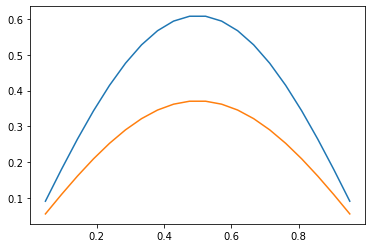

In [3]:
import matplotlib.pyplot as plt

# Eulers metode, fra matte 1/ProgNumSikk

def euler(f,x0,a,b,N):
    t = np.linspace(a,b,N)
    x = np.zeros((N,x0.size))
    x[0,:] = x0
    for i in np.arange(N-1):
        x[i+1,:] = x[i,:] + (t[i+1]-t[i])*(f(x[i],t[i]))
    return x,t

# funksjonen f(x,t)= Ax - F settes inn i Eulers metode
def f(x,t):
    return A @ x - F

# Initialbetingelsene
# Siden vi har Dirichlet betingelse er ikke sidepunktene x[0] og x[-1] med
u0 = np.sin(np.pi*x[1:-1])

# 1000 tidssteg - vi trenger mange for å få en bra resultat, siden vi bruker forlengs Euler
# 0 er initial tid
# 1 er sluttid
u, t = euler(f, u0, 0, 1, 1000)

fig, ax = plt.subplots()

# løsning etter steg 50 i blå
ax.plot(x[1:-1],u[50,:])
# løsninger etter steg 100 i oransje
ax.plot(x[1:-1],u[100,:])


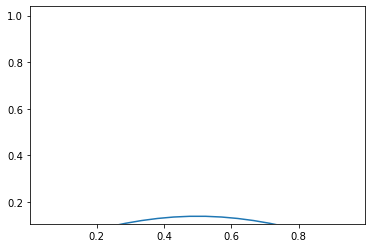

In [10]:
# Nå ser vi på løsninger med en animasjon

import matplotlib.animation as animation

fig, ax = plt.subplots()

line, = ax.plot(x[1:-1], u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

# vi stopper etter bare en femtedel av tidsteg, da vi har nesten nådd 0 allerede
ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size/5)

from IPython.display import HTML
HTML(ani.to_jshtml())

### b) Eksempel 2: Neumann randbetingelser

Nå prøver vi med Neumann randbetingelser, og løser varmeligningen

$$
u_t = u_{xx}, \quad 0<x<1, \quad u_x(0,t)=0, u_x(1,t)=0, \quad u(x,0)=\sin(\pi x)
$$

med koden under.

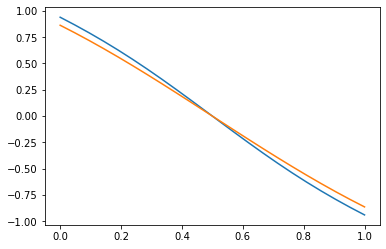

In [12]:
# B kom fra 1b over, "Koden gjenbrukes fra 6_1: Neumann"

B = (c**2)*L2

def g(x,t):
    return B @ x - G

# initialbetingelser
v0 = np.cos(np.pi*x)

# løsning med Eulers metode
v, t = euler(g, v0, 0, 1, 1000)

fig, ax = plt.subplots()

# etter 50 steg i blå
ax.plot(x,v[50,:])
# etter 100 steg i oransje
ax.plot(x,v[100,:])

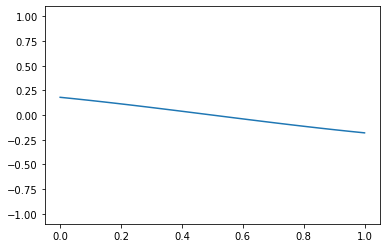

In [15]:
fig, ax = plt.subplots()

line, = ax.plot(x, v[0,:])

def animate(i):
    line.set_ydata(v[i,:])
    return line,

# Denne gangen ser vi på alle tidssteg
ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())